# Dermnet - Kamień milowy 2 (Feature engineering)
### 0. Pakiety

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import cv2

#%pip install tensorflow
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.cluster import KMeans
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import TSNE

## 1. Przygotowanie
### 1.1. Import danych

In [2]:
# df1 = pd.read_pickle('train_data_1.pkl')
# df2 = pd.read_pickle('train_data_2.pkl')
# df = pd.concat([df1, df2], axis=0)
df = pd.read_pickle('train_data.pkl')
X_train, X_val = train_test_split(df, test_size=0.3, random_state=42)

KeyboardInterrupt: 

In [4]:
# to check if ok
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10889 entries, 7735 to 7270
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   10889 non-null  object
dtypes: object(1)
memory usage: 170.1+ KB


### 1.2. Funkcje do modyfikacji i wizualizacji obrazów

In [44]:
random.seed(2137)
chosen_indexes = random.sample(range(len(X_train['image'])), 8)

def visualize_random_images(df, indexes = [0, 1, 2, 3, 4, 5, 6, 7]):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    for i in range(8):
        img = df['image'].iloc[indexes[i]]
        ax = axes[i//4, i%4]
        ax.imshow(img)
        ax.axis('off')


def convert_to_grayscale(data_frame, colname='image'):
    '''
    Convert the RGB images to grayscale
    '''
    result = []
    k=0
    for image in data_frame['image']:
        r, g, b = image[:,:,0], image[:,:,1], image[:,:,2]
        gray = 0.33 * r + 0.33 * g + 0.33 * b
        result.append(gray)
    result = pd.DataFrame({colname : result})
    return result


def visualize_random_images_grey(df, indexes = [0, 1, 2, 3, 4, 5, 6, 7]):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    for i in range(8):
        img = df['image'].iloc[indexes[i]]
        ax = axes[i//4, i%4]
        ax.imshow(img, cmap='gray')
        ax.axis('off')


def extract_rgb_channel(data_frame, colname='image', color='red'):
    '''
    Convert the RGB images to grayscale
    '''
    if color == 'red':
        channel = 0
    elif color == 'green':
        channel = 1
    elif color == 'blue':
        channel = 2
    result = []
    k=0
    for image in data_frame['image']:
        modified_image = np.zeros_like(image)
        modified_image[:,:,channel] = image[:,:,channel]
        result.append(modified_image)
    result = pd.DataFrame({colname : result})
    return result


def global_threshold(df, tresh, colname = 'image'):
    '''
    Runs threshold on all images in df
    '''
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        result.append((image > tresh) * 255)
    result = pd.DataFrame({colname : result})
    return result

def reverse_threshold(df, tresh, colname = 'image'):
    '''
    Runs threshold on all images in df
    '''
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        result.append((image < tresh) * 255)
    result = pd.DataFrame({colname : result})
    return result

def detect_images(df, low_th = 50, high_th = 150, blur_ksize = 5, colname = 'image'):
    '''
    Runs edge detection on all images in df
    '''
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        image = (image * 255).astype(np.uint8)
        blurred_image = cv2.GaussianBlur(image, (blur_ksize, blur_ksize), 0)

        edges = cv2.Canny(blurred_image, low_th, high_th)  
        result.append(edges)
    result = pd.DataFrame({colname : result})
    return result

def convert_to_negative_image(df, colname = 'image'):
    '''
    Converts the image to negative
    '''
    result = []
    for image in df[colname]:
        result.append(255 - image)
    result = pd.DataFrame({colname : result})
    return result

def erosion(df, kernel_size=(5,5), iterations=1, colname='image'):
    result = []
    kernel = np.ones(kernel_size, np.uint8)
    for image in df[colname]:
        eroded_image = cv2.erode(image, kernel, iterations=iterations)
        result.append(eroded_image)
    result = pd.DataFrame({colname: result})
    return result

def dilation(df, kernel_size=(5,5), iterations=1, colname='image'):
    result = []
    kernel = np.ones(kernel_size, np.uint8)
    for image in df[colname]:
        dilated_image = cv2.dilate(image, kernel, iterations=iterations)
        result.append(dilated_image)
    result = pd.DataFrame({colname: result})
    return result

def reverse_hough_transform(df, threshold=100, colname='image'):
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        image = image.astype(np.uint8)  # Convert to CV_8U data type
        edges = cv2.Canny(image, 50, 150, apertureSize=3)
        lines = cv2.HoughLines(edges, 1, np.pi/180, threshold)  # Define 'lines' variable
        if lines is not None:
            for rho, theta in lines[:, 0]:
                a = np.cos(theta)
                b = np.sin(theta)
                x0 = a * rho
                y0 = b * rho
                x1 = int(x0 + 1000 * (-b))
                y1 = int(y0 + 1000 * (a))
                x2 = int(x0 - 1000 * (-b))
                y2 = int(y0 - 1000 * (a))
                cv2.line(image, (x1, y1), (x2, y2), (0, 0, 255), 2)
        result.append(image)
    result = pd.DataFrame({colname: result})
    return result

## Modyfikacja obrazów

## 2. Grayscale

In [7]:
X_train_grayscale = convert_to_grayscale(X_train)

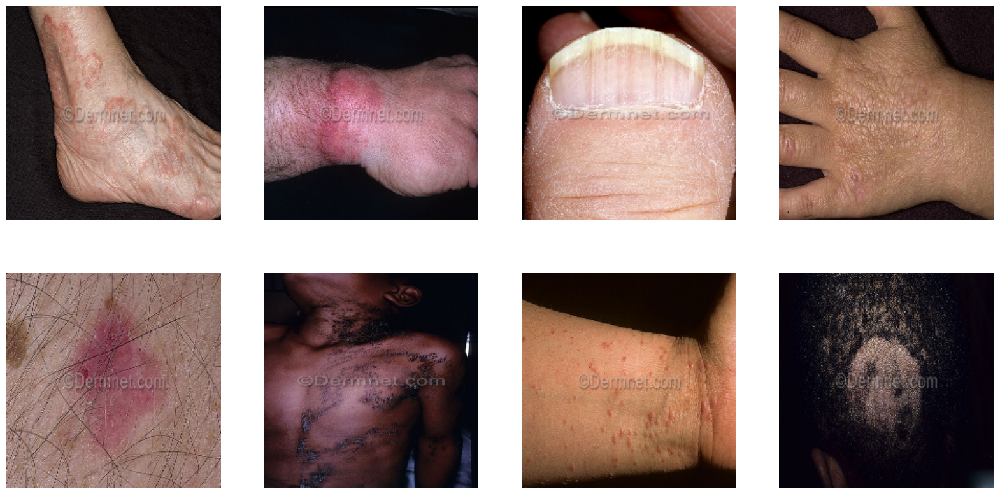

In [8]:
visualize_random_images(X_train, chosen_indexes)

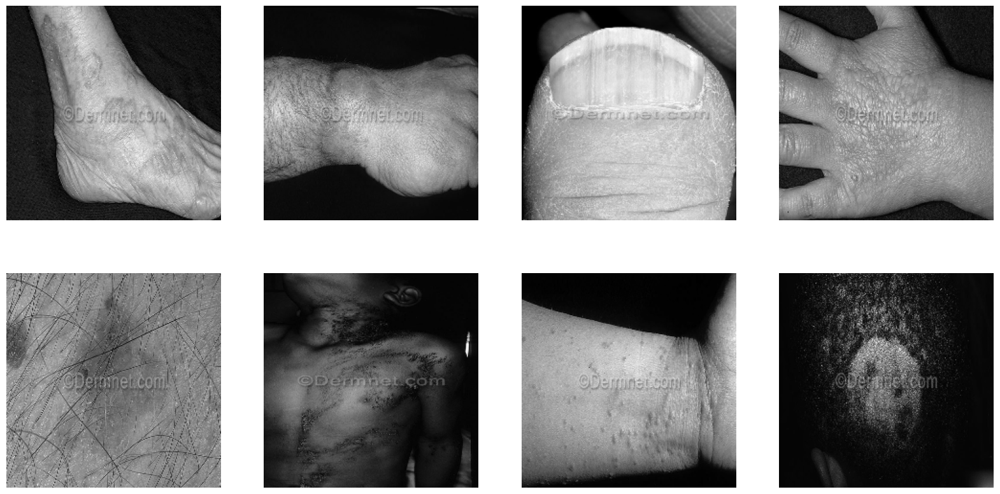

In [9]:
visualize_random_images_grey(X_train_grayscale, chosen_indexes)

## 3. RGB Channels
### 3.1. Red

In [10]:
X_train_red = extract_rgb_channel(X_train, color='red')

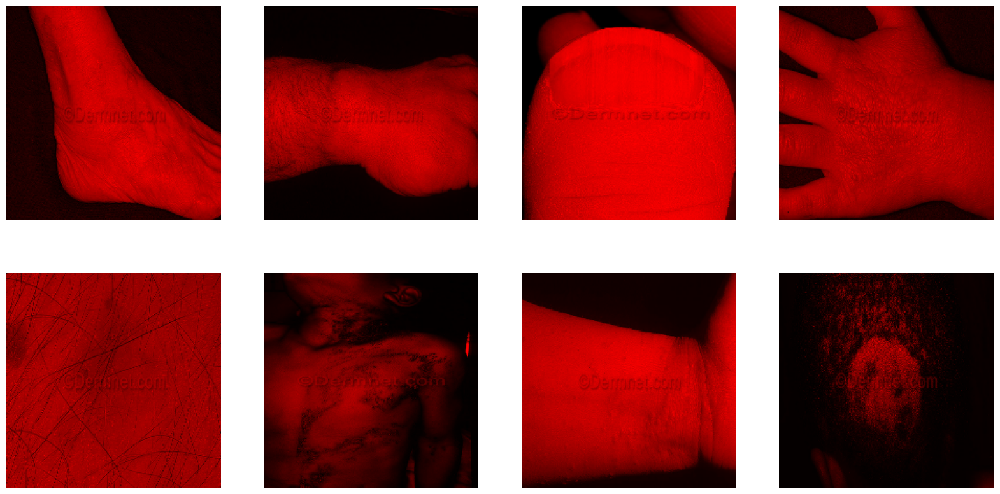

In [11]:
visualize_random_images(X_train_red, chosen_indexes)

### 3.1. Green

In [12]:
X_train_green = extract_rgb_channel(X_train, color='green')

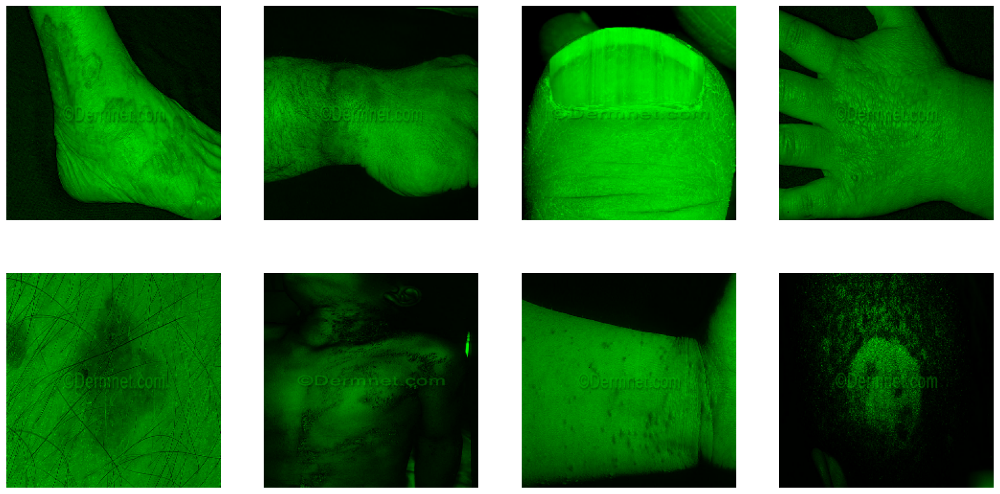

In [13]:
visualize_random_images(X_train_green, chosen_indexes)

### 3.3. Blue

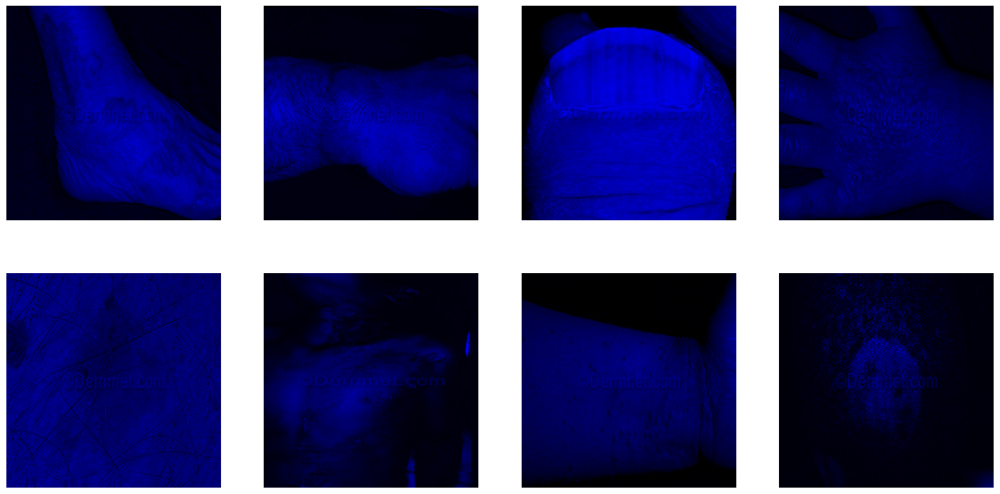

In [14]:
X_train_blue = extract_rgb_channel(X_train, color='blue')
visualize_random_images(X_train_blue, chosen_indexes)

## 4. Thresholding
### 4.1. globalny 

thresh = 100

In [15]:
X_train_threshold_100 = global_threshold(X_train_grayscale, 100)

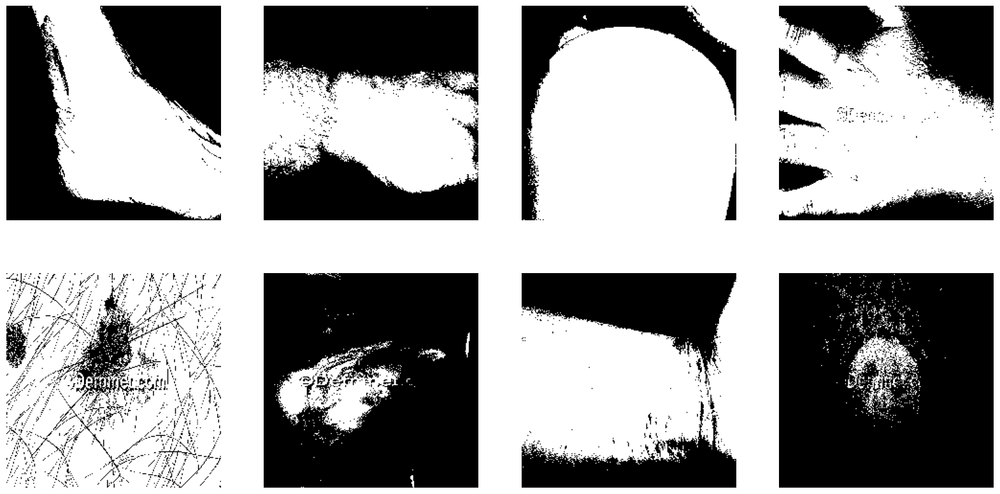

In [16]:
visualize_random_images_grey(X_train_threshold_100, chosen_indexes)

thresh = 150

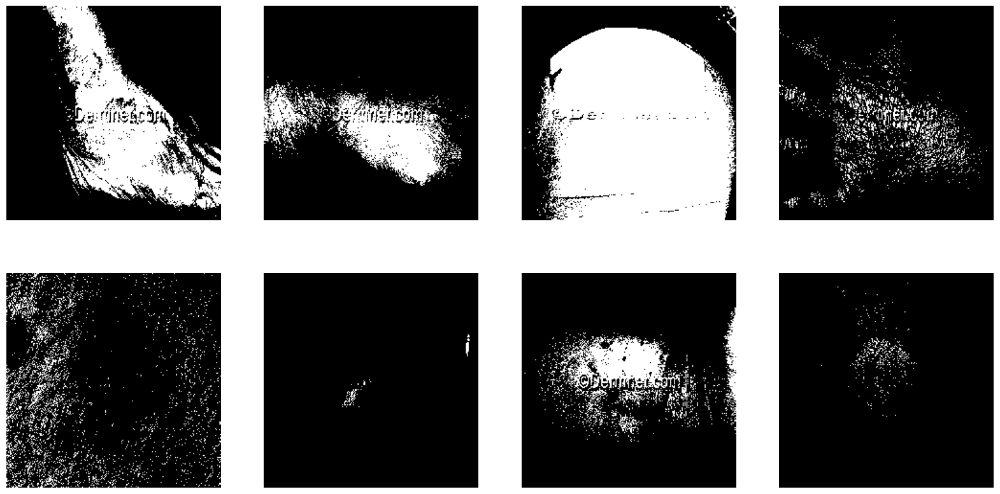

In [17]:
X_train_threshold_150 = global_threshold(X_train_grayscale, 150)
visualize_random_images_grey(X_train_threshold_150, chosen_indexes)

thresh = 125

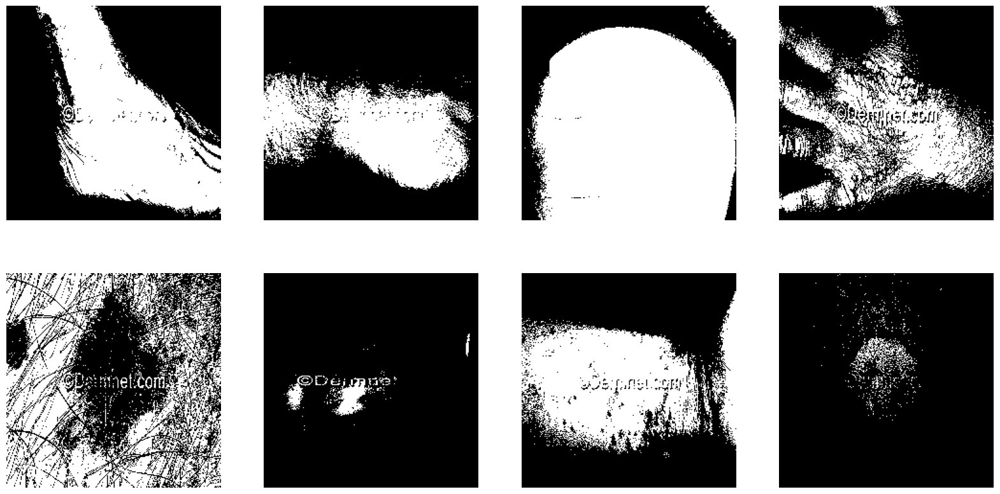

In [18]:
X_train_threshold_125 = global_threshold(X_train_grayscale, 125)
visualize_random_images_grey(X_train_threshold_125, chosen_indexes)

### 4.2. reverse thresholding

thresh=100 (best)

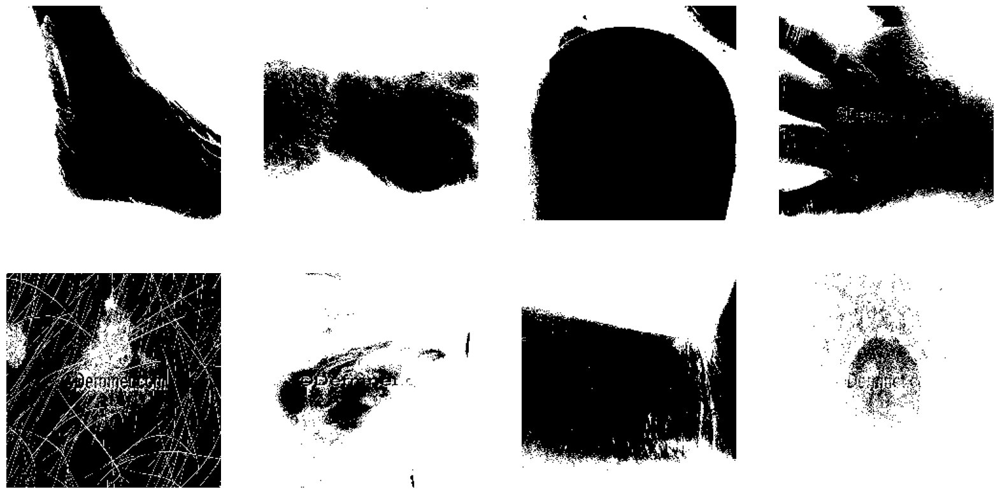

In [19]:
X_train_rev_threshold_100 = reverse_threshold(X_train_grayscale, 100)
visualize_random_images_grey(X_train_rev_threshold_100, chosen_indexes)

## 5. Edge detection

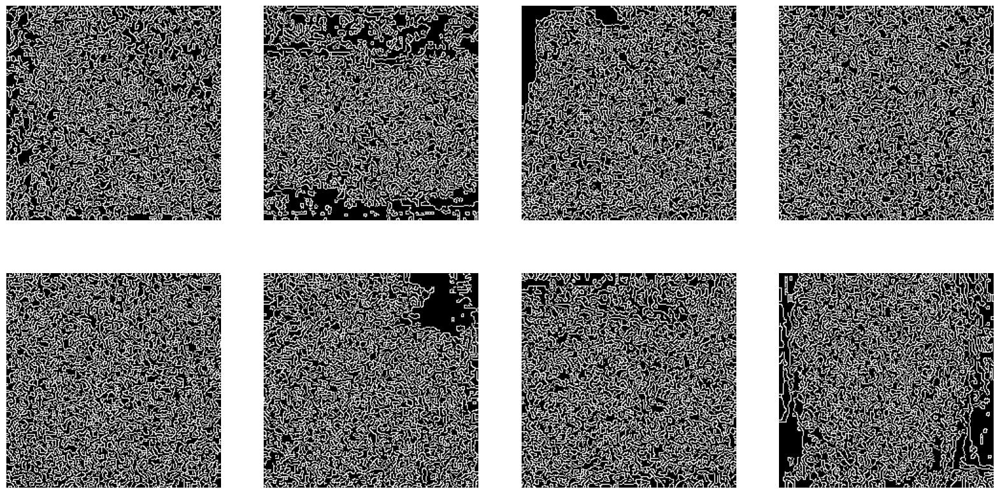

In [20]:
X_train_edges = detect_images(X_train_grayscale)
visualize_random_images_grey(X_train_edges, chosen_indexes)

## 6. Negative

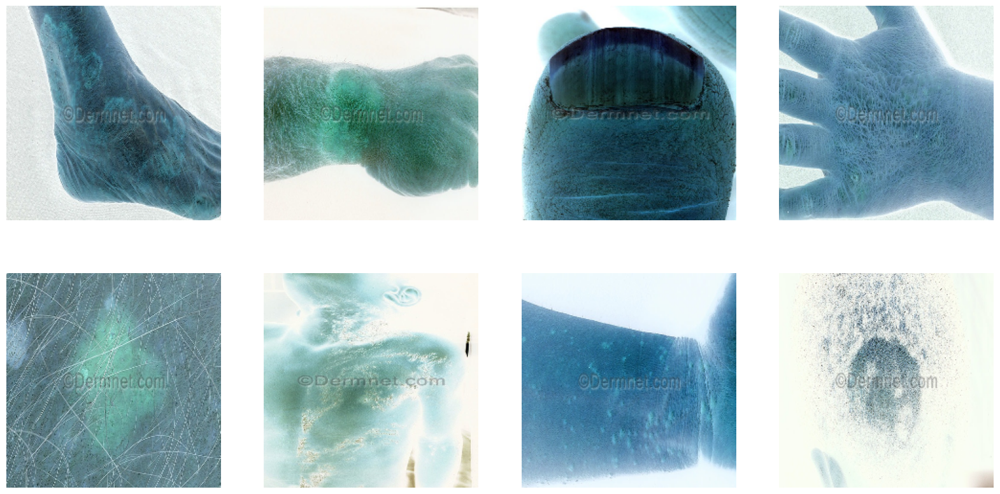

In [21]:
X_train_negative = convert_to_negative_image(X_train)
visualize_random_images(X_train_negative, chosen_indexes)

## 7. Erozja i dylatacja

Erozja - pomniejsza białe obszary na obrazie. Jest to przydatne do usuwania drobnych zakłóceń (szumów) oraz oddzielania obiektów, które są blisko siebie.

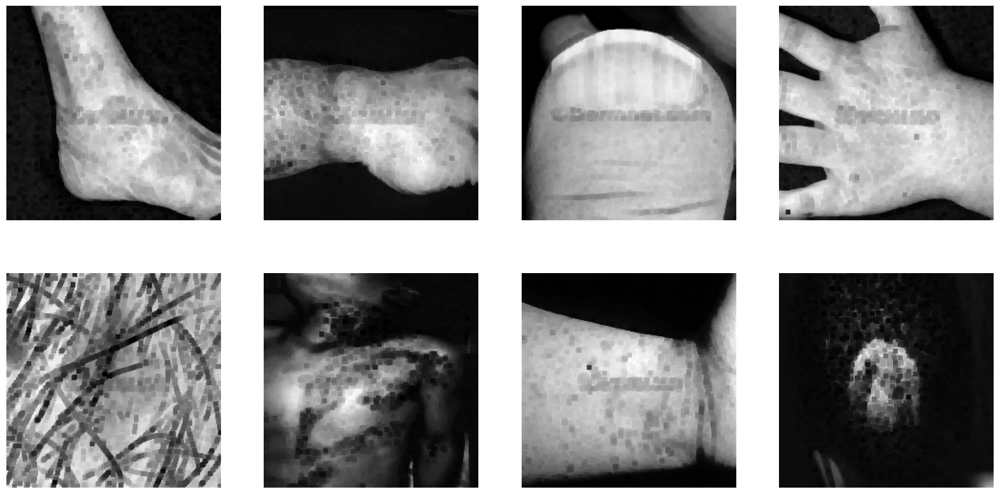

In [25]:
X_train_eroded = erosion(X_train_grayscale)
visualize_random_images_grey(X_train_eroded, chosen_indexes)

Dylatacja - zwiększa białe obszary na obrazie. Jest przydatna do wypełniania luk między obiektami oraz łączenia małych obiektów w większe.

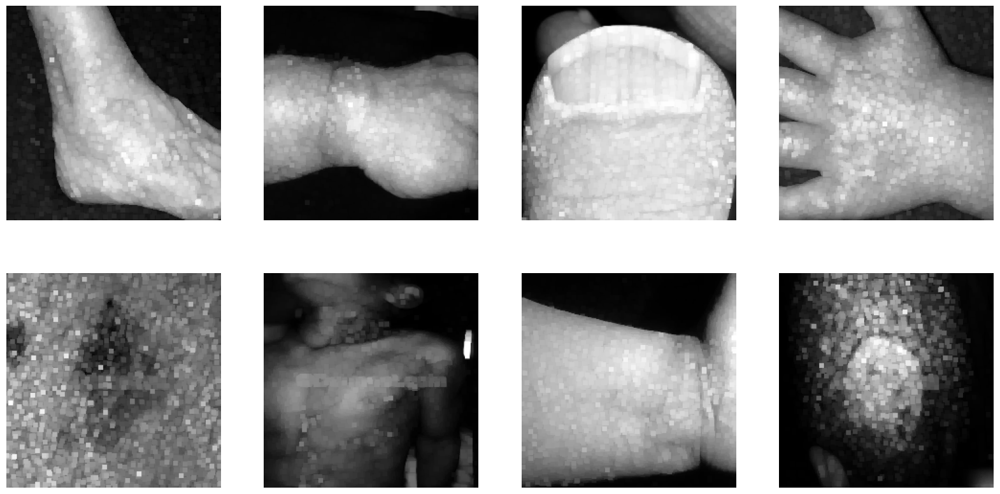

In [36]:
X_train_dilated = dilation(X_train_grayscale)
visualize_random_images_grey(X_train_dilated, chosen_indexes)

## 8. Odwrócona transformacja Hougha

Odwrócona transformacja Hougha - detekcjia prostych linii na obrazach. Transformacja Hougha jest techniką wykrywania kształtów geometrycznych, takich jak linie proste, na obrazie.

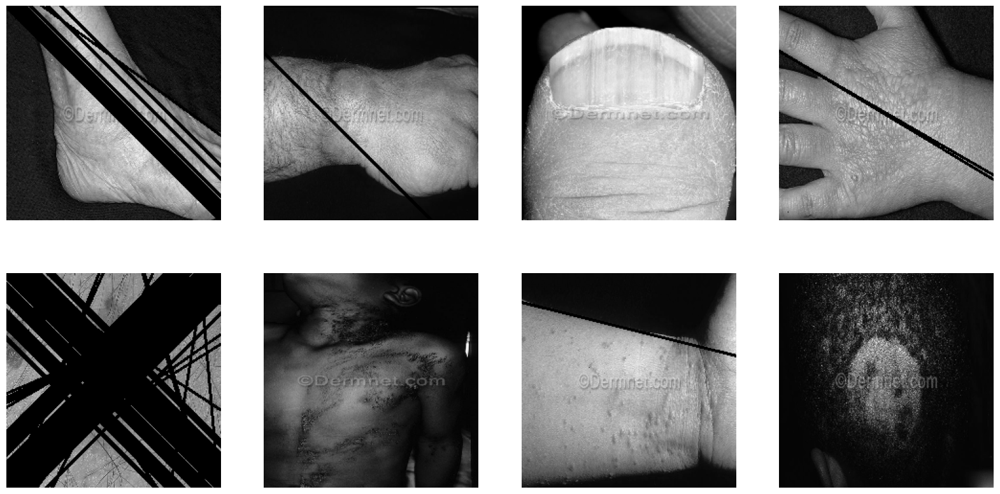

In [45]:
X_train_hough = reverse_hough_transform(X_train_grayscale)
visualize_random_images_grey(X_train_hough, chosen_indexes)

In [46]:
def laplacian_filter(df, colname='image', ksize=3):
    """
    Applies Laplacian filtering to images in DataFrame.

    Parameters:
        df (DataFrame): DataFrame containing images.
        colname (str): Name of the column containing images in the DataFrame. Default is 'image'.
        ksize (int): Aperture linear size; it must be odd and greater than 1 (e.g., 3, 5, 7, ...). Default is 3.

    Returns:
        DataFrame: DataFrame with Laplacian filtered images.
    """
    # Kopiowanie DataFrame, aby uniknąć modyfikacji oryginalnego
    result_df = df.copy()

    # Zastosowanie filtracji Laplasjanowej do każdego obrazu w DataFrame
    result_df[colname] = df[colname].apply(lambda img: cv2.Laplacian(img, cv2.CV_64F, ksize=ksize))

    return result_df

X_train_laplacian = laplacian_filter(X_train_grayscale)
visualize_random_images_grey(X_train_laplacian, chosen_indexes)

: 

## Weryfikacja

In [22]:
def prepare_images_for_clustering(data_frame, colname = 'image'):
    result = []
    for image in data_frame[colname]:
        img_array = img_to_array(image)
        flat_img_array = img_array.flatten()
        result.append(flat_img_array)
    result = np.array(result)
    flat_images = result / 255.0

    return flat_images

def count_wcss_scores(data, max_clusters = 10):
    scores = []
    for k in range(1, max_clusters):
        kmeans = KMeans(n_clusters=k, random_state=42, init='k-means++')
        kmeans.fit(data)
        wcss = kmeans.score(data) * -1
        scores.append(wcss)
    return scores

def visualize_elbow_method(data, colname = 'image', max_clusters = 26, n_components=0.8):
    X = prepare_images_for_clustering(data, colname)
    X_pca = PCA(n_components)
    X_pca.fit(X)

    css_vec = count_wcss_scores(X_pca, 26)
    x_ticks = list(range(1, len(wcss_vec) + 1))
    plt.plot(x_ticks, wcss_vec, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Within-cluster sum of squares')
    plt.title('The Elbow Method showing the optimal k')
    plt.show()

def analyze_clusters(data, colname = 'image', n_clusters = 4, limit=0.8, batch_size=100):
    X = prepare_images_for_clustering(data, colname)

    ipca = IncrementalPCA(n_components=None, batch_size=batch_size)
    ipca.fit(X)
    n_components = np.argmax(explained_variance >= limit) + 1
    ipca = IncrementalPCA(n_components=n_components, batch_size=batch_size)
    X_pca = ipca.fit_transform(X)

    wcss_vec = count_wcss_scores(X_pca, 30)
    x_ticks = list(range(1, len(wcss_vec) + 1))

    return wcss_vec, x_ticks

### 1. Dane nieprzetworzone

*OD TERAZ W DÓŁ JEST BAŁAGAN*

In [5]:
X = prepare_images_for_clustering(X_train)

In [8]:
batch_size = 100
ipca = IncrementalPCA(n_components=None, batch_size=batch_size)
ipca.fit(X)
explained_variance = np.cumsum(ipca.explained_variance_ratio_)
n_components = np.argmax(explained_variance >= explained_variance_ratio) + 1
ipca = IncrementalPCA(n_components=n_components, batch_size=batch_size)
reduced_images = ipca.fit_transform(X)
    

NameError: name 'explained_variance_ratio' is not defined

In [11]:
n_components = np.argmax(explained_variance >= 0.8) + 1
ipca = IncrementalPCA(n_components=n_components, batch_size=batch_size)
X_train_pca = ipca.fit_transform(X)

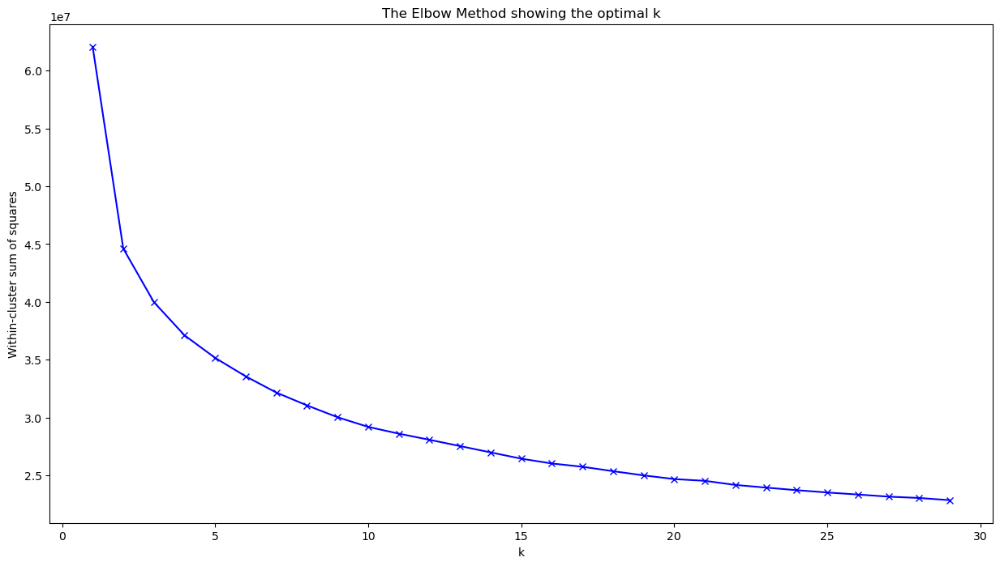

In [17]:
wcss_vec = count_wcss_scores(X_train_pca, 30)
x_ticks = list(range(1, len(wcss_vec) + 1))
plt.figure(figsize=(15, 8))
plt.plot(x_ticks, wcss_vec, 'bx-')
plt.xlabel('k')
plt.ylabel('Within-cluster sum of squares')
plt.title('The Elbow Method showing the optimal k')
plt.show()

*KONIEC BAŁAGANU*

### 2. Dane modyfikowane

In [26]:
elbow_scores_grayscale = analyze_clusters(X_train_grayscale, colname='image', n_clusters=30, limit=0.8, batch_size=100)

In [27]:
elbow_scores_red = analyze_clusters(X_train_red, colname='image', n_clusters=30, limit=0.8, batch_size=100)

In [28]:
elbow_scores_green = analyze_clusters(X_train_green, colname='image', n_clusters=30, limit=0.8, batch_size=100)

In [29]:
elbow_scores_blue = analyze_clusters(X_train_blue, colname='image', n_clusters=30, limit=0.8, batch_size=100)

In [30]:
elbow_scores_negative = analyze_clusters(X_train_negative, colname='image', n_clusters=30, limit=0.8, batch_size=100)

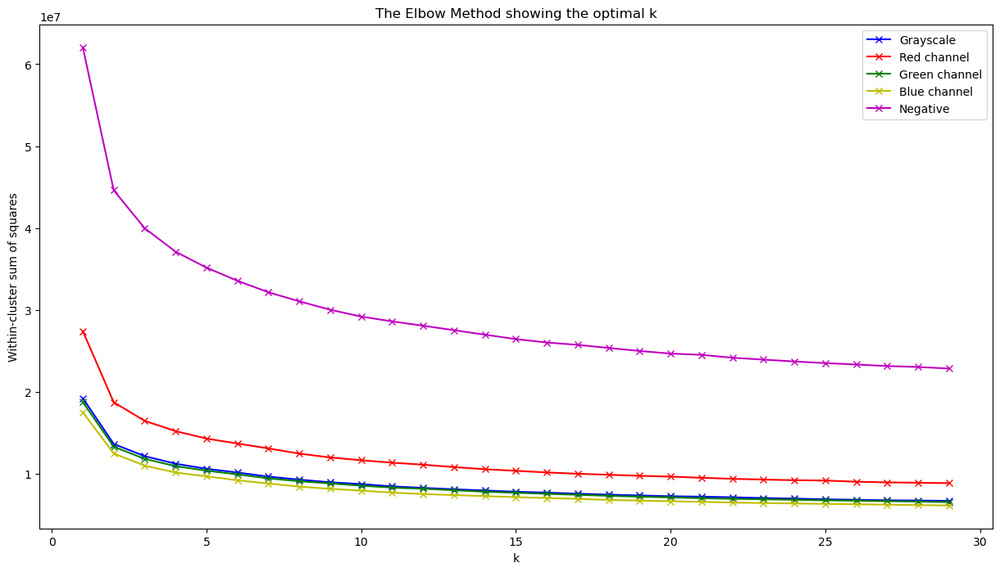

In [34]:
# draw plot where on x-axis we have number of clusters and on y-axis we have WCSS for different images
plt.figure(figsize=(15, 8))
plt.plot(elbow_scores_grayscale[1], elbow_scores_grayscale[0], 'bx-', label='Grayscale')
plt.plot(elbow_scores_red[1], elbow_scores_red[0], 'rx-', label='Red channel')
plt.plot(elbow_scores_green[1], elbow_scores_green[0], 'gx-', label='Green channel')
plt.plot(elbow_scores_blue[1], elbow_scores_blue[0], 'yx-', label='Blue channel')
plt.plot(elbow_scores_negative[1], elbow_scores_negative[0], 'mx-', label='Negative')
plt.xlabel('k')
plt.ylabel('Within-cluster sum of squares')
plt.title('The Elbow Method showing the optimal k')
plt.legend()
plt.show()

### TSNE
Wizualizacja klasteryzacji.

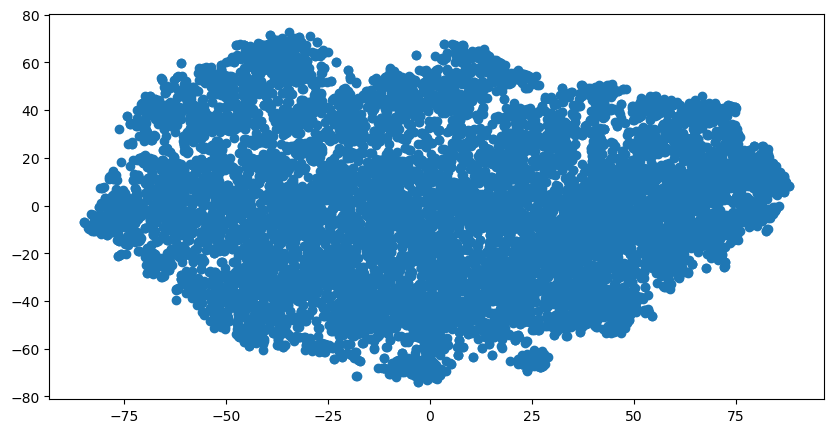

In [33]:
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(X_train_pca)
plt.figure(figsize=(10, 5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])